# Project 2 For CS194-26

# Importing libraries

In [36]:
import skimage as sk
import os
import seaborn as sns
from skimage import data, io, filters
import numpy as np
import skimage.io as skio
import cv2
from skimage import exposure
from skimage import feature
import skimage.viewer
import time
import scipy

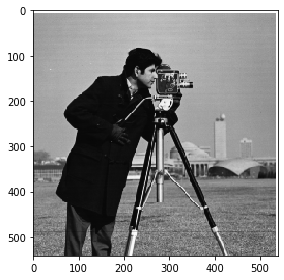

In [37]:
import numpy as np
import skimage as sk
import skimage.io as skio

# name of the input file
imname = 'cameraman.png'

# read in the image
im = skio.imread(imname)

# convert to double (might want to do this later on to save memory)    
im = sk.img_as_float(im)
    
im_out = im


# display the image
skio.imshow(im_out)
skio.show()

# Part 1.1

In [38]:
from scipy import signal
d_x = np.array([[1,-1], [0,0]])

grad_x = signal.convolve2d(im[:,:,0], d_x)


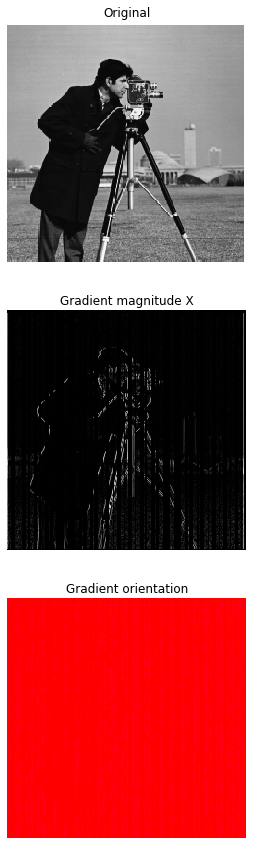

In [39]:
import matplotlib.pyplot as plt

fig, (ax_orig, ax_mag, ax_ang) = plt.subplots(3, 1, figsize=(6, 15))
ax_orig.imshow(im, cmap='gray')
ax_orig.set_title('Original')
ax_orig.set_axis_off()
ax_mag.imshow(np.absolute(grad_x), cmap='gray')
ax_mag.set_title('Gradient magnitude X')
ax_mag.set_axis_off()
ax_ang.imshow(np.angle(grad_x), cmap='hsv') # hsv is cyclic, like angles
ax_ang.set_title('Gradient orientation')
ax_ang.set_axis_off()
fig.show()

In [5]:
d_y = d_x.T
grad_y = signal.convolve2d(im[:,:,0], d_y)

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  # This is added back by InteractiveShellApp.init_path()


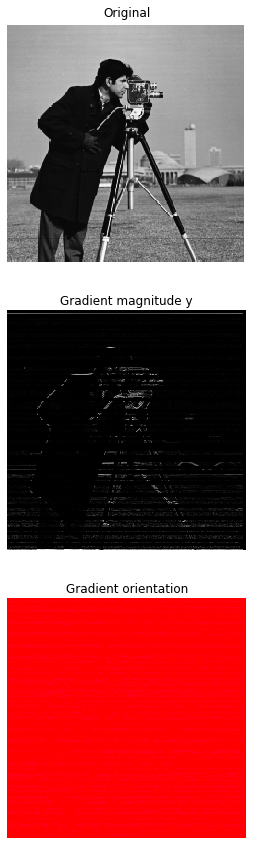

In [6]:
fig, (ax_orig, ax_mag, ax_ang) = plt.subplots(3, 1, figsize=(6, 15))
ax_orig.imshow(im, cmap='gray')
ax_orig.set_title('Original')
ax_orig.set_axis_off()
ax_mag.imshow(np.absolute(grad_y), cmap='gray')
ax_mag.set_title('Gradient magnitude y')
ax_mag.set_axis_off()
ax_ang.imshow(np.angle(grad_y), cmap='hsv') # hsv is cyclic, like angles
ax_ang.set_title('Gradient orientation')
ax_ang.set_axis_off()
fig.show()

This is the Gradient Magnitude Image


/Applications/anaconda3/lib/python3.7/site-packages/skimage/io/_plugins/matplotlib_plugin.py:150: UserWarning: Float image out of standard range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)


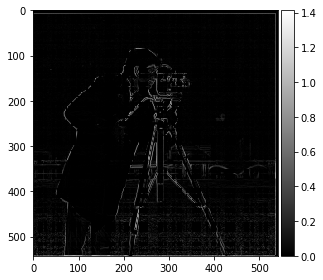

In [7]:
#Gradient Magnitude Image
grad_mag = np.sqrt(grad_x**2 + grad_y**2)
print('This is the Gradient Magnitude Image')
skio.imshow(grad_mag, cmap ='gray');

# Thresholding

Binarized gradient magnitude image with thresholding


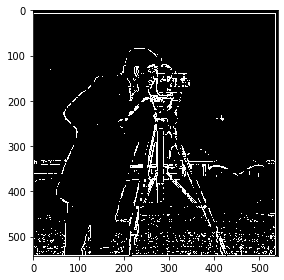

In [8]:
sum_grad = np.sqrt(grad_x**2 + grad_y**2)
thresh = 0.13
for i in range(len(sum_grad)):
    for j in range(len(sum_grad[0])):
        if sum_grad[i][j] >= thresh:
            sum_grad[i][j] = 1
        else:
            sum_grad[i][j] = 0
print('Binarized gradient magnitude image with thresholding')
skio.imshow(sum_grad, cmap ='gray');

# Part 1.2

In [ ]:
#first way
gauss = cv2.getGaussianKernel(15, 2.5)
outer = np.dot(gauss, gauss.T)
blurry = signal.convolve2d(im[:,:,0], outer)
grad_blur_x = signal.convolve2d(blurry, d_x)
grad_blur_y = signal.convolve2d(blurry, d_y)
#Gradient Magnitude Image
grad_mag = np.sqrt(abs(grad_blur_x)**2 + abs(grad_blur_y)**2)*3


#second way 
gasx = signal.convolve2d(outer, d_x)
gasy = signal.convolve2d(outer, d_y)
grad_gasx = signal.convolve2d(im[:,:,0], gasx)
grad_gasy = signal.convolve2d(im[:,:,0], gasy)
#Gradient Magnitude Image
grad_mag = np.sqrt(abs(grad_gasy**2) + abs(grad_gasy**2))*3

In [ ]:
#second way 
gasx = signal.convolve2d(outer, d_x)
gasy = signal.convolve2d(outer, d_y)
grad_gasx = signal.convolve2d(im[:,:,0], gasx)
grad_gasy = signal.convolve2d(im[:,:,0], gasy)
#Gradient Magnitude Image
grad_mag = np.sqrt(abs(grad_gasy**2) + abs(grad_gasy**2))*3

In [9]:
gauss = cv2.getGaussianKernel(15, 2.5)
outer = np.dot(gauss, gauss.T)

In [10]:
blurry = signal.convolve2d(im[:,:,0], outer)

In [11]:
grad_blur_x = signal.convolve2d(blurry, d_x)

/Applications/anaconda3/lib/python3.7/site-packages/skimage/io/_plugins/matplotlib_plugin.py:150: UserWarning: Low image data range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)


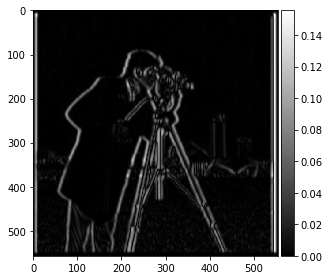

In [12]:
skio.imshow(abs(grad_blur_x), cmap = 'gray')

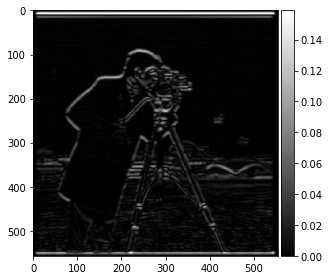

In [13]:
grad_blur_y = signal.convolve2d(blurry, d_y)
skio.imshow(abs(grad_blur_y), cmap = 'gray')

This is the Gradient Magnitude Image


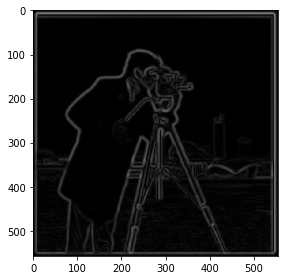

In [38]:
#Gradient Magnitude Image
grad_mag = np.sqrt(abs(grad_blur_x)**2 + abs(grad_blur_y)**2)*3

print('This is the Gradient Magnitude Image')
skio.imshow(grad_mag, cmap ='gray');

## Second way: Find the Derivative of Gaussian on x axis (dx) and y axis (dy), and apply them to the original image (unblurred)

In [20]:
gasx = signal.convolve2d(outer, d_x)
gasy = signal.convolve2d(outer, d_y)


In [24]:

grad_gasx = signal.convolve2d(im[:,:,0], gasx)
grad_gasy = signal.convolve2d(im[:,:,0], gasy)

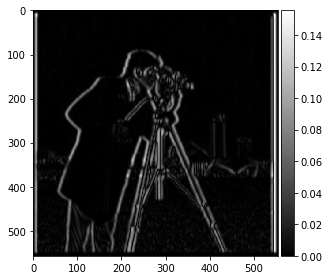

In [28]:
skio.imshow(abs(grad_gasx), cmap = 'gray')

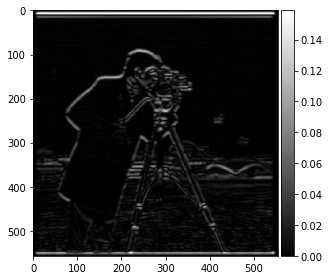

In [29]:
skio.imshow(abs(grad_gasy), cmap = 'gray')

This is the Gradient Magnitude Image for the second way. 


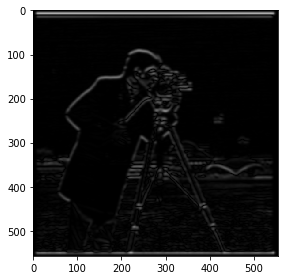

In [37]:
#Gradient Magnitude Image
grad_mag = np.sqrt(abs(grad_gasy**2) + abs(grad_gasy**2))*3
print('This is the Gradient Magnitude Image for the second way. ')
skio.imshow(grad_mag, cmap ='gray');

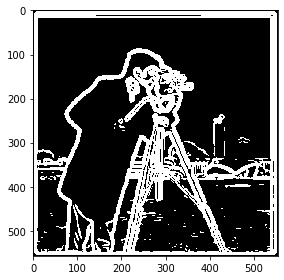

In [1024]:
#Thresholding 

sum_grad = np.sqrt(grad_blur_x**2 + grad_blur_y**2)
thresh = 0.016


for i in range(len(sum_grad)):
    for j in range(len(sum_grad[0])):
        if sum_grad[i][j] >= thresh:
            sum_grad[i][j] = 1
        else:
            sum_grad[i][j] = 0

skio.imshow(sum_grad, cmap ='gray');

# Part 1.3

In [7]:
def cropping_perct(img, crop_factor = 0, pix = 0):
    '''Crop image by perfectage(crop_factor)'''
    
    if crop_factor != 0:
        y_pix = int(crop_factor*len(img[0]))
        x_pix = int(crop_factor*len(img))
        new_img = img[x_pix:-x_pix,y_pix:-y_pix]
        return new_img
    
    elif pix != 0:
        new_img = img[pix:-pix,pix:-pix]
        return new_img
    
   

In [8]:
gauss = cv2.getGaussianKernel(15, 2.5)
outer = np.dot(gauss, gauss.T)

In [9]:
# name of the input file
imf = 'facade.jpg'
# read in the image
imf = skio.imread(imf)
imff = sk.img_as_float(imf)

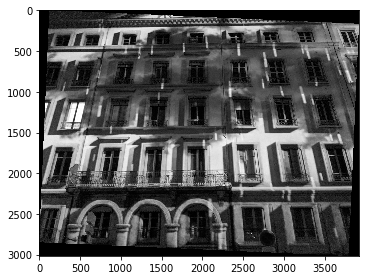

In [10]:
rotate = scipy.ndimage.interpolation.rotate(imf[:,:,0], -2.53)
skio.imshow(rotate)
skio.show()

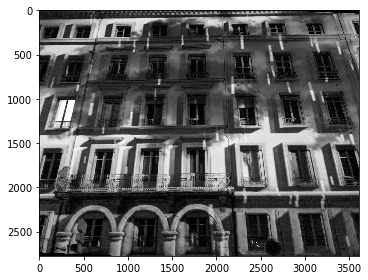

In [11]:
cropped = cropping_perct(rotate, 0.04)
skio.imshow(cropped)
skio.show()

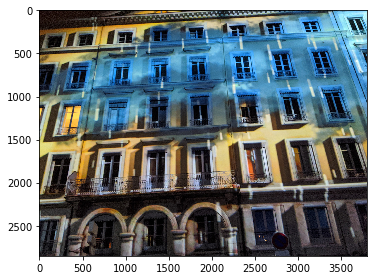

In [12]:
skio.imshow(imff)
skio.show()

/Applications/anaconda3/lib/python3.7/site-packages/skimage/io/_plugins/matplotlib_plugin.py:150: UserWarning: Float image out of standard range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)


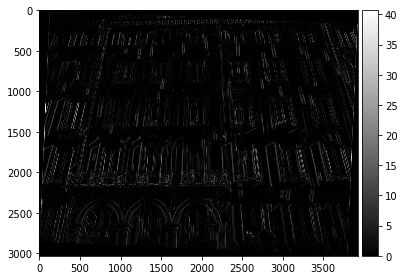

In [13]:
blurry2 = signal.convolve2d(rotate, outer)
grad_x2 = signal.convolve2d(blurry2, d_x)
grad_y2 = signal.convolve2d(blurry2, d_y)
skio.imshow(abs(grad_x2), cmap = 'gray')


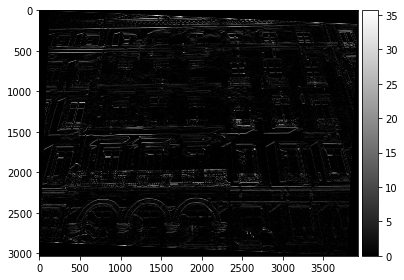

In [14]:
skio.imshow(abs(grad_y2), cmap = 'gray')

In [851]:
blurry3 = signal.convolve2d(imff[:,:,0], outer)
grad_x3 = signal.convolve2d(blurry3, d_x)
grad_y3 = signal.convolve2d(blurry3, d_y)

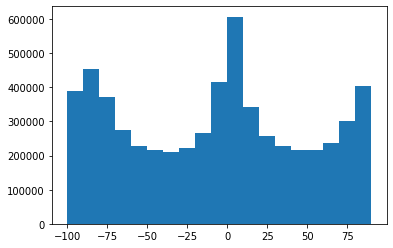

In [15]:
blurry3 = signal.convolve2d(imff[:,:,0], outer)
grad_x3 = signal.convolve2d(blurry3, d_x)
grad_y3 = signal.convolve2d(blurry3, d_y)
angs = np.arctan2(grad_x3, grad_y3).reshape(-1)
plt.hist(np.degrees(angs), bins= np.arange(-100,100, 10));

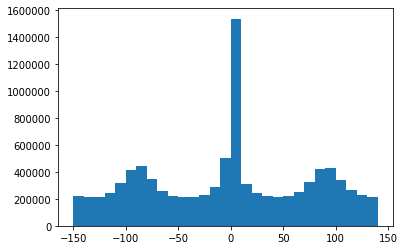

In [16]:
angs = np.arctan2(grad_x2, grad_y2).reshape(-1)
plt.hist(np.degrees(angs), bins= np.arange(-150,150, 10));

In [17]:
def grad_angle(img_name, range_angs, crop_fac):
    # Initialization
    optimal_hist = np.zeros(len(angs))
    optimal_rot, counter = 0, 0

    # read in the image
    im = skio.imread(img_name)
    im = sk.img_as_float(im)
    rotate_list = np.arange(-10, 10, 1)
    for i in rotate_list:
        rotate_img = scipy.ndimage.interpolation.rotate(im[:,:,0], i)
        cropped_image = cropping_perct(rotate_img, crop_fac)
        blurry = signal.convolve2d(rotate_img, outer)
        grad_x, grad_y = signal.convolve2d(blurry, d_x), signal.convolve2d(blurry, d_y)
        angles = (np.degrees(np.arctan2(grad_x, grad_y)).reshape(-1)) #gradient of angles
        edges_angs = ((((90 - range_angs < np.absolute(angles)) & (90 + range_angs < np.absolute(angles))).sum()) 
                      + (((180-range_angs < np.absolute(angles)) & (90+range_angs < np.absolute(angles))).sum()) 
                      + (((0-range_angs < np.absolute(angles)) & (0+range_angs < np.absolute(angles))).sum()))
        
        
        if edges_angs > counter:
            optimal_hist, counter = angs, edges_angs
            optimal_rot = i 
    return im, optimal_rot, optimal_hist
    
         
    

This is the the best angle: -3
This is the histogram for the best angle
This is the original image
This is the rotated image
This is the histogram


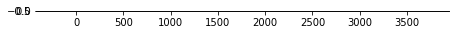

In [883]:
image, optimal_angle,best_histogram = grad_angle('facade.jpg',2)
print("This is the original image")
skio.imshow(image)
skio.show()
optimally_rotated = scipy.ndimage.interpolation.rotate(image, optimal_angle)
#optimally_rotated= cropper(optimally_rotated, 0.04)
print("This is the rotated image")
skio.imshow(optimally_rotated)
skio.show()
print("This is the histogram")
sns.distplot(best_histogram)

This is the histogram


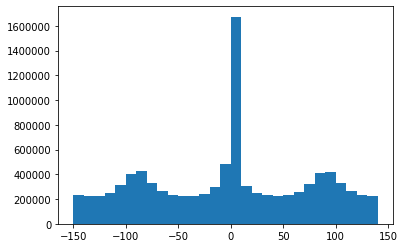

In [887]:
print("This is the histogram")

plt.hist(best_histogram, bins= np.arange(-150,150, 10));

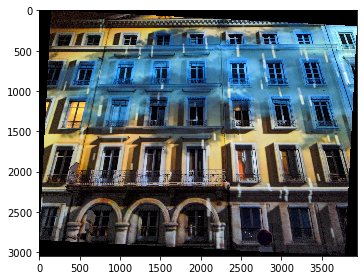

In [884]:
skio.imshow(optimally_rotated)
skio.show()

In [57]:
# name of the input file
im_build = 'building_rotated.jpg'
# read in the image
im_build = skio.imread(im_build)
im_build = sk.img_as_float(im_build)

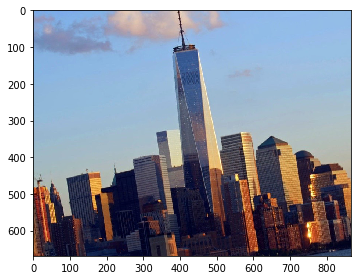

In [58]:
skio.imshow(im_build)
skio.show()

In [18]:
image, optimal_angle,best_histogram = grad_angle('building_rotated.jpg',2, 0.08)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


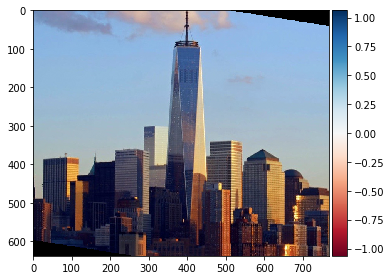

In [21]:
optimally_rotated = scipy.ndimage.interpolation.rotate(image, -optimal_angle)
cropped = cropping_perct(optimally_rotated, 0.1)
skio.imshow(cropped)
skio.show()

In [968]:
image, optimal_angle,best_histogram = grad_angle('building_rotated.jpg',2, 0.08)

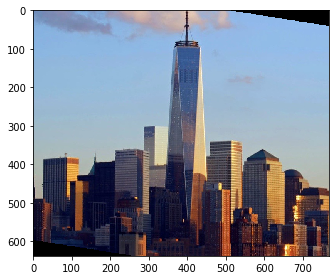

In [969]:
optimally_rotated = scipy.ndimage.interpolation.rotate(image, -optimal_angle)
cropped = cropping_perct(optimally_rotated, 0.1)
skio.imshow(cropped)
skio.show()

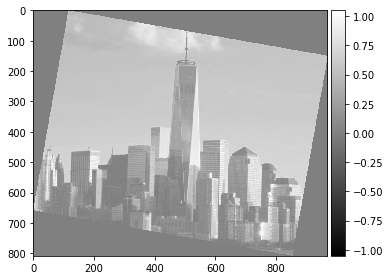

In [930]:
rotate = scipy.ndimage.interpolation.rotate(im_build[:,:,0], -10)
skio.imshow(rotate, cmap='gray')
skio.show()

This is the histogram


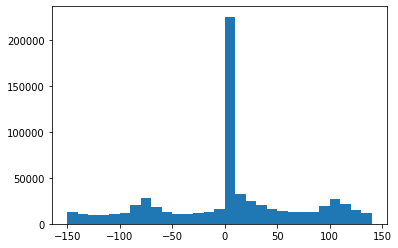

In [970]:
print("This is the histogram")
#sns.distplot(best_histogram)

plt.hist(best_histogram, bins= np.arange(-150,150, 10));

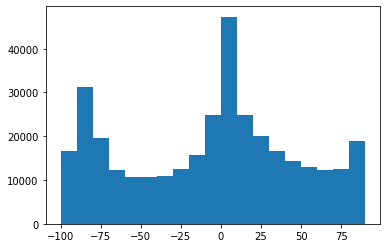

In [971]:
blurry3 = signal.convolve2d(im_build[:,:,0], outer)
grad_x3 = signal.convolve2d(blurry3, d_x)
grad_y3 = signal.convolve2d(blurry3, d_y)
angs = np.arctan2(grad_x3, grad_y3).reshape(-1)
plt.hist(np.degrees(angs), bins= np.arange(-100,100, 10));

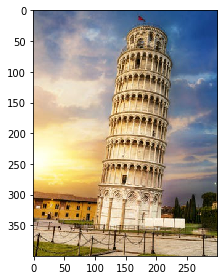

In [949]:
# name of the input file
im_pisa = 'pisa.jpg'
# read in the image
im_pisa = skio.imread(im_pisa)
im_pisa = sk.img_as_float(im_pisa)
skio.imshow(im_pisa)
skio.show()

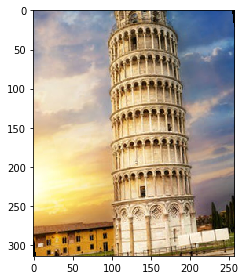

In [950]:
image, optimal_angle,best_histogram = grad_angle('pisa.jpg',2, 0.04)
optimally_rotated = scipy.ndimage.interpolation.rotate(image, -optimal_angle)
cropped = cropping_perct(optimally_rotated, 0.15)
skio.imshow(cropped)
skio.show()

This is the histogram


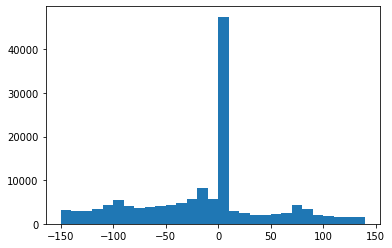

In [940]:
print("This is the histogram")
#sns.distplot(best_histogram)

plt.hist(best_histogram, bins= np.arange(-150,150, 10));

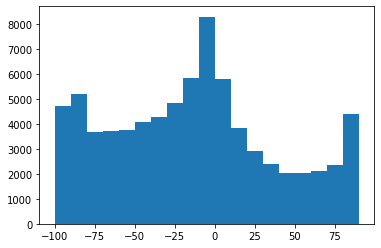

In [941]:
blurry3 = signal.convolve2d(im_pisa[:,:,0], outer)
grad_x3 = signal.convolve2d(blurry3, d_x)
grad_y3 = signal.convolve2d(blurry3, d_y)
angs = np.arctan2(grad_x3, grad_y3).reshape(-1)
plt.hist(np.degrees(angs), bins= np.arange(-100,100, 10));

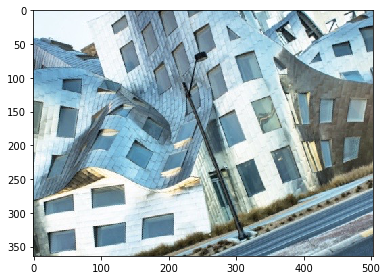

In [953]:
#failure case

# name of the input file
im_curved = 'curved.jpg'
# read in the image
im_curved = skio.imread(im_curved)
im_pisa = sk.img_as_float(im_curved)
skio.imshow(im_curved)
skio.show()

The optimal angle is:
0


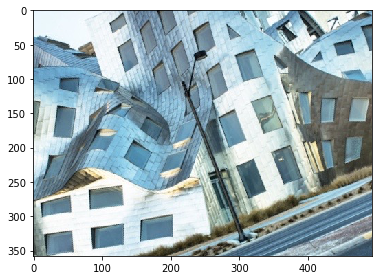

In [967]:
image, optimal_angle,best_histogram = grad_angle('curved.jpg',2, 0.04)
optimally_rotated = scipy.ndimage.interpolation.rotate(image, -optimal_angle)
cropped = cropping_perct(optimally_rotated, 0.01)
print('The optimal angle is:')
print(optimal_angle)
skio.imshow(cropped)
skio.show()

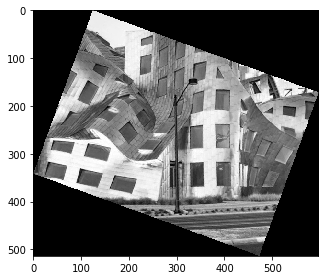

In [957]:
# Lets try and manually rotate it 
rotate = scipy.ndimage.interpolation.rotate(im_curved[:,:,0], -20)
skio.imshow(rotate, cmap='gray')
skio.show()

This is the histogram


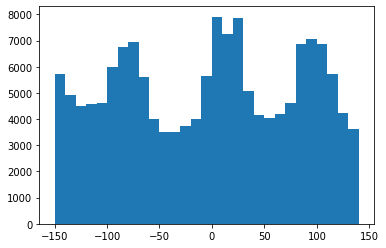

In [964]:
print("This is the histogram")
#sns.distplot(best_histogram)

plt.hist(best_histogram, bins= np.arange(-150,150, 10));

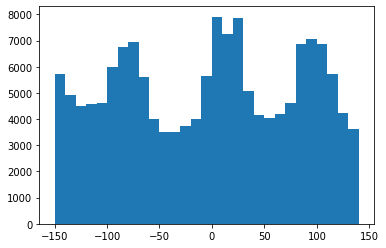

In [966]:
blurry3 = signal.convolve2d(im_curved[:,:,0], outer)
grad_x3 = signal.convolve2d(blurry3, d_x)
grad_y3 = signal.convolve2d(blurry3, d_y)
angs = np.arctan2(grad_x3, grad_y3).reshape(-1)
plt.hist(np.degrees(angs), bins= np.arange(-150,150, 10));

# Part 2.1: Image "Sharpening"

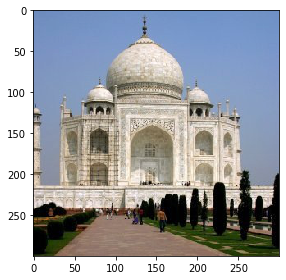

In [91]:
# name of the input file
imftaj = 'taj.jpg'
# read in the image
imftaj = skio.imread(imftaj)
imfftaj = sk.img_as_float(imftaj)
skio.imshow(imfftaj)

In [92]:
blurry_taj = np.zeros((np.shape(imfftaj)[0], np.shape(imfftaj)[1], 3))
blurry_taj[:,:,0] = signal.convolve2d(imfftaj[:,:,0], outer, mode = 'same')
blurry_taj[:,:,1] = signal.convolve2d(imfftaj[:,:,1], outer, mode = 'same')
blurry_taj[:,:,2] = signal.convolve2d(imfftaj[:,:,2], outer, mode = 'same')

In [93]:
high_res = np.zeros((np.shape(imfftaj)[0], np.shape(imfftaj)[1], 3))
high_res[:,:,0] = imfftaj[:,:,0] - blurry_taj[:,:,0]
high_res[:,:,1] = imfftaj[:,:,1] - blurry_taj[:,:,1]
high_res[:,:,2] = imfftaj[:,:,2] - blurry_taj[:,:,2]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


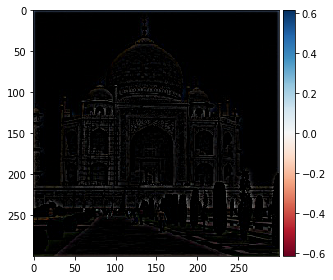

In [95]:
skio.imshow(high_res);

In [96]:
sharp = np.zeros((np.shape(imfftaj)[0], np.shape(imfftaj)[1], 3))
sharp[:,:,0] = high_res[:,:,0] + imfftaj[:,:,0]
sharp[:,:,1] = high_res[:,:,1] + imfftaj[:,:,1]
sharp[:,:,2] = high_res[:,:,2] + imfftaj[:,:,2]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


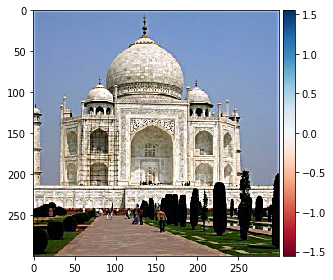

In [97]:
skio.imshow(sharp)

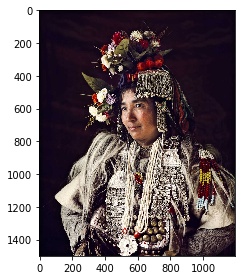

In [522]:
gauss = cv2.getGaussianKernel(10, 2)
outer = np.dot(gauss, gauss.T)
# name of the input file
imfmount = 'jimmy_nelson.jpg'
# read in the image
imfmount = skio.imread(imfmount)
imffmount = sk.img_as_float(imfmount)
skio.imshow(imffmount)

In [523]:
blurry_mount = np.zeros((np.shape(imffmount)[0], np.shape(imffmount)[1], 3))
blurry_mount[:,:,0] = signal.convolve2d(imffmount[:,:,0], outer, mode = 'same')
blurry_mount[:,:,1] = signal.convolve2d(imffmount[:,:,1], outer, mode = 'same')
blurry_mount[:,:,2] = signal.convolve2d(imffmount[:,:,2], outer, mode = 'same')

high_mount = np.zeros((np.shape(imffmount)[0], np.shape(imffmount)[1], 3))
high_mount[:,:,0] = imffmount[:,:,0] - blurry_mount[:,:,0]
high_mount[:,:,1] = imffmount[:,:,1] - blurry_mount[:,:,1]
high_mount[:,:,2] = imffmount[:,:,2] - blurry_mount[:,:,2]

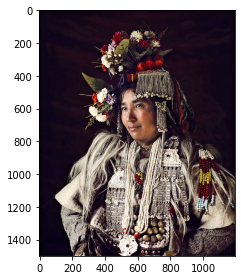

In [524]:
skio.imshow(blurry_mount)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


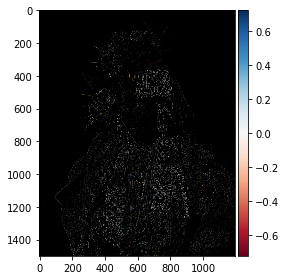

In [525]:
skio.imshow(high_mount);

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


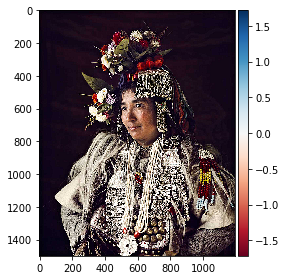

In [526]:
sharp_mount = np.zeros((np.shape(imffmount)[0], np.shape(imffmount)[1], 3))
sharp_mount[:,:,0] = high_mount[:,:,0] + imffmount[:,:,0]
sharp_mount[:,:,1] = high_mount[:,:,1] + imffmount[:,:,1]
sharp_mount[:,:,2] = high_mount[:,:,2] + imffmount[:,:,2]
skio.imshow(sharp_mount)

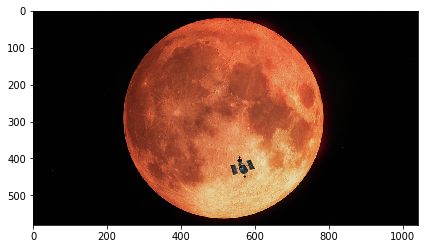

In [521]:
# name of the input file
mars = 'mars.png'
# read in the image
mars = skio.imread(mars)
marsimf = sk.img_as_float(mars)
skio.imshow(marsimf)

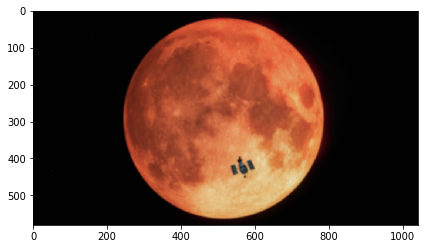

In [114]:
blurry_mars = np.zeros((np.shape(marsimf)[0], np.shape(marsimf)[1], 3))
blurry_mars[:,:,0] = signal.convolve2d(marsimf[:,:,0], outer, mode = 'same')
blurry_mars[:,:,1] = signal.convolve2d(marsimf[:,:,1], outer, mode = 'same')
blurry_mars[:,:,2] = signal.convolve2d(marsimf[:,:,2], outer, mode = 'same')

high_mars = np.zeros((np.shape(marsimf)[0], np.shape(marsimf)[1], 3))
high_mars[:,:,0] = marsimf[:,:,0] - blurry_mars[:,:,0]
high_mars[:,:,1] = marsimf[:,:,1] - blurry_mars[:,:,1]
high_mars[:,:,2] = marsimf[:,:,2] - blurry_mars[:,:,2]

skio.imshow(blurry_mars)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


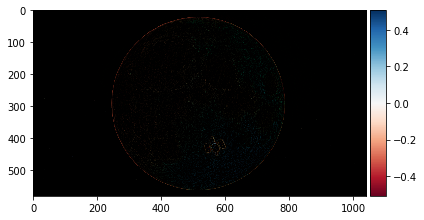

In [115]:
skio.imshow(high_mars)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


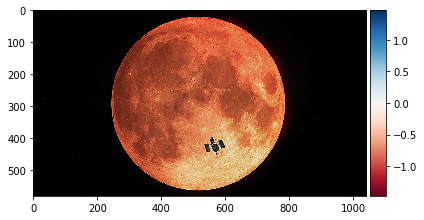

In [116]:
sharp_mars = np.zeros((np.shape(marsimf)[0], np.shape(marsimf)[1], 3))
sharp_mars[:,:,0] = high_mars[:,:,0] + marsimf[:,:,0]
sharp_mars[:,:,1] = high_mars[:,:,1] + marsimf[:,:,1]
sharp_mars[:,:,2] = high_mars[:,:,2] + marsimf[:,:,2]
skio.imshow(sharp_mars)

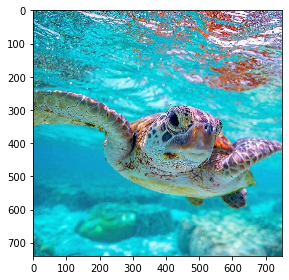

In [117]:
# name of the input file
turtle = 'turtle.jpg'
# read in the image
turtle = skio.imread(turtle)
turtleimf = sk.img_as_float(turtle)
skio.imshow(turtleimf)

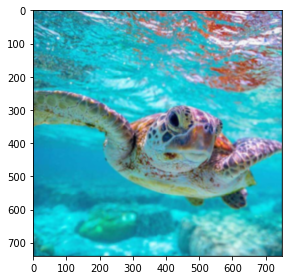

In [121]:
blurry_turtle = np.zeros((np.shape(turtleimf)[0], np.shape(turtleimf)[1], 3))
blurry_turtle[:,:,0] = signal.convolve2d(turtleimf[:,:,0], outer, mode = 'same')
blurry_turtle[:,:,1] = signal.convolve2d(turtleimf[:,:,1], outer, mode = 'same')
blurry_turtle[:,:,2] = signal.convolve2d(turtleimf[:,:,2], outer, mode = 'same')

high_turtle = np.zeros((np.shape(turtleimf)[0], np.shape(turtleimf)[1], 3))
high_turtle[:,:,0] = turtleimf[:,:,0] - blurry_turtle[:,:,0]
high_turtle[:,:,1] = turtleimf[:,:,1] - blurry_turtle[:,:,1]
high_turtle[:,:,2] = turtleimf[:,:,2] - blurry_turtle[:,:,2]

skio.imshow(blurry_turtle)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


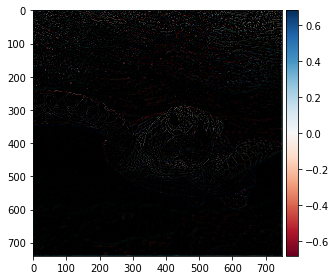

In [122]:
skio.imshow(high_turtle)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


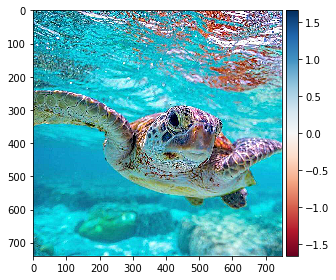

In [119]:
sharp_turtle = np.zeros((np.shape(turtleimf)[0], np.shape(turtleimf)[1], 3))
sharp_turtle[:,:,0] = high_turtle[:,:,0] + turtleimf[:,:,0]
sharp_turtle[:,:,1] = high_turtle[:,:,1] + turtleimf[:,:,1]
sharp_turtle[:,:,2] = high_turtle[:,:,2] + turtleimf[:,:,2]
skio.imshow(sharp_turtle)

# Part 2.2: Hybrid Images

In [186]:
def contrast(img):
    v_min, v_max = np.percentile(img ,(10.5, 80.5))
    return exposure.rescale_intensity(img, in_range = (v_min, v_max))

In [203]:
import math
import numpy as np
import skimage.transform as sktr
import matplotlib.pyplot as plt





def get_points(im1, im2):
    print('Please select 2 points in each image for alignment.')
    plt.imshow(im1)
    p1, p2 = plt.ginput(2)
    plt.close()
    plt.imshow(im2)
    p3, p4 = plt.ginput(2)
    plt.close()
    return (p1, p2, p3, p4)

def recenter(im, r, c):
    R, C, _ = im.shape
    rpad = (int) (np.abs(2*r+1 - R))
    cpad = (int) (np.abs(2*c+1 - C))
    return np.pad(
        im, [(0 if r > (R-1)/2 else rpad, 0 if r < (R-1)/2 else rpad),
             (0 if c > (C-1)/2 else cpad, 0 if c < (C-1)/2 else cpad),
             (0, 0)], 'constant')

def find_centers(p1, p2):
    cx = np.round(np.mean([p1[0], p2[0]]))
    cy = np.round(np.mean([p1[1], p2[1]]))
    return cx, cy

def align_image_centers(im1, im2, pts):
    p1, p2, p3, p4 = pts
    h1, w1, b1 = im1.shape
    h2, w2, b2 = im2.shape
    
    cx1, cy1 = find_centers(p1, p2)
    cx2, cy2 = find_centers(p3, p4)

    im1 = recenter(im1, cy1, cx1)
    im2 = recenter(im2, cy2, cx2)
    return im1, im2

def rescale_images(im1, im2, pts):
    p1, p2, p3, p4 = pts
    len1 = np.sqrt((p2[1] - p1[1])**2 + (p2[0] - p1[0])**2)
    len2 = np.sqrt((p4[1] - p3[1])**2 + (p4[0] - p3[0])**2)
    dscale = len2/len1
    if dscale < 1:
        im1 = sktr.rescale(im1, dscale, multichannel = True)
    else:
        im2 = sktr.rescale(im2, 1./dscale, multichannel = True)
    return im1, im2

def rotate_im1(im1, im2, pts):
    p1, p2, p3, p4 = pts
    theta1 = math.atan2(-(p2[1] - p1[1]), (p2[0] - p1[0]))
    theta2 = math.atan2(-(p4[1] - p3[1]), (p4[0] - p3[0]))
    dtheta = theta2 - theta1
    im1 = sktr.rotate(im1, dtheta*180/np.pi)
    return im1, dtheta

def match_img_size(im1, im2):
    # Make images the same size
    h1, w1, c1 = im1.shape
    h2, w2, c2 = im2.shape
    if h1 < h2:
        im2 = im2[int(np.floor((h2-h1)/2.)) : -int(np.ceil((h2-h1)/2.)), :, :]
    elif h1 > h2:
        im1 = im1[int(np.floor((h1-h2)/2.)) : -int(np.ceil((h1-h2)/2.)), :, :]
    if w1 < w2:
        im2 = im2[:, int(np.floor((w2-w1)/2.)) : -int(np.ceil((w2-w1)/2.)), :]
    elif w1 > w2:
        im1 = im1[:, int(np.floor((w1-w2)/2.)) : -int(np.ceil((w1-w2)/2.)), :]
        assert im1.shape == im2.shape
    return im1, im2

def align_images(im1, im2):
    pts = get_points(im1, im2)
    im1, im2 = align_image_centers(im1, im2, pts)
    im1, im2 = rescale_images(im1, im2, pts)
    im1, angle = rotate_im1(im1, im2, pts)
    im1, im2 = match_img_size(im1, im2)
    return im1, im2


if __name__ == "__main__":
    # 1. load the image
    
    # 2. align the two images by calling align_images
    # Now you are ready to write your own code for creating hybrid images!
    pass


In [204]:
import matplotlib
matplotlib.use('TkAgg')


In [205]:

# First load images

# high sf
im1 = skio.imread('./nutmeg.jpg')/255
# im1=np.nan_to_num(im1)

# low sf
im2 = skio.imread('./DerekPicture.jpg')/255
# im2=np.nan_to_num(im2)
# Next align images (this code is provided, but may be improved)
im1_aligned, im2_aligned = align_images(im1, im2)

## You will provide the code below. Sigma1 and sigma2 are arbitrary 
## cutoff values for the high and low frequencies



Please select 2 points in each image for alignment.


In [206]:
im1_aligned = contrast(im1_aligned)
#im2_aligned = contrast(im2_aligned)

In [ ]:
%matplotlib inline

In [207]:
gauss = cv2.getGaussianKernel(50, 10)
outer = np.dot(gauss, gauss.T)

In [208]:
low_res1 = np.zeros((np.shape(im1_aligned)[0], np.shape(im1_aligned)[1], 3))
high_res1 = np.zeros((np.shape(im1_aligned)[0], np.shape(im1_aligned)[1], 3))
for i in range(3):
    low_res1[:,:, i] = signal.convolve2d(im1_aligned[:,:, i], outer, mode = 'same')
    high_res1[:,:,i] = im1_aligned[:,:,i] - low_res1[:,:,i]

In [209]:
low_res2 = np.zeros((np.shape(im2_aligned)[0], np.shape(im2_aligned)[1], 3))
high_res2 = np.zeros((np.shape(im2_aligned)[0], np.shape(im2_aligned)[1], 3))
for i in range(3):
    print("i:", i)
    low_res2[:,:, i] = signal.convolve2d(im2_aligned[:,:, i], outer, mode = 'same')
    print("subtracting")
    high_res2[:,:,i] = im2_aligned[:,:,i]  - low_res2[:,:,i]

i: 0
subtracting
i: 1
subtracting
i: 2
subtracting


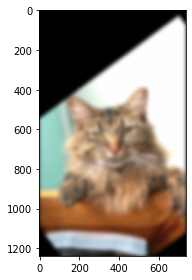

In [210]:
skio.imshow(low_res1)

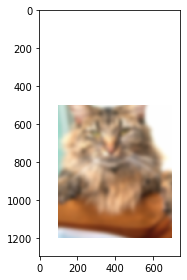

In [197]:
low_res_cropped = np.ones((np.shape(im2_aligned)[0], np.shape(im2_aligned)[1], 3))
low_res_cropped[500:1200,100:700] = low_res1[500:1200,100:700]
skio.imshow(low_res_cropped)

In [198]:
low_res2 = np.zeros((np.shape(im2_aligned)[0], np.shape(im2_aligned)[1], 3))
high_res2 = np.zeros((np.shape(im2_aligned)[0], np.shape(im2_aligned)[1], 3))
for i in range(3):
    print("i:", i)
    low_res2[:,:, i] = signal.convolve2d(im2_aligned[:,:, i], outer, mode = 'same')
    print("subtracting")
    high_res2[:,:,i] = im2_aligned[:,:,i]  - low_res2[:,:,i]

i: 0
subtracting
i: 1
subtracting
i: 2
subtracting


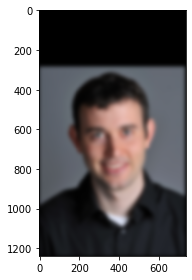

In [211]:
skio.imshow(low_res2)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


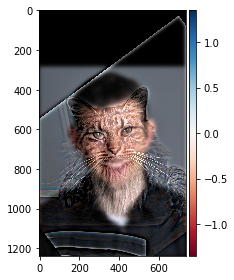

In [212]:
mix = np.zeros((np.shape(im2_aligned)[0], np.shape(im2_aligned)[1], 3))
for i in range(3):
    mix[:,:, i] = high_res1[:,:,i] + low_res2[:,:, i]
skio.imshow(mix);

In [ ]:
mix = np.zeros((np.shape(im2_aligned)[0], np.shape(im2_aligned)[1], 3))
for i in range(3):
    mix[:,:, i] = high_res1[:,:,i] + low_res2[:,:, i]
skio.imshow(mix);

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


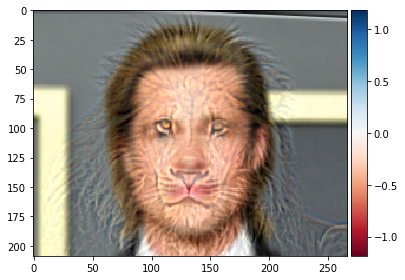

In [456]:
skio.imshow(cropping_perct(mix, crop_factor= 0.12))

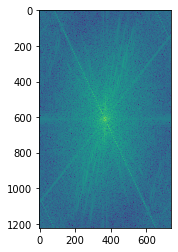

In [160]:
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(mix[:,:,0])))))

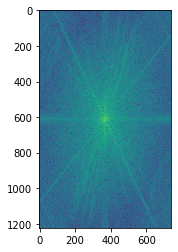

In [155]:
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(im1_aligned[:,:,0])))))

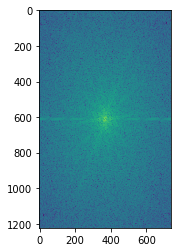

In [162]:
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(im2_aligned[:,:,0])))))

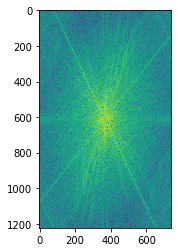

In [154]:
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(high_res1[:,:,0])))))

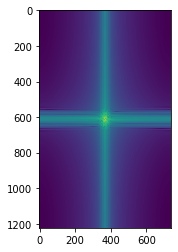

In [161]:
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(low_res2[:,:,0])))))

In [121]:
import matplotlib

matplotlib.use('TkAgg')


In [122]:

# First load images

# high sf
im2 = skio.imread('barack.jpg')/255
# im1=np.nan_to_num(im1)

# low sf
im1 = skio.imread('michelle.jpg')/255
# im2=np.nan_to_num(im2)
# Next align images (this code is provided, but may be improved)
im1_aligned, im2_aligned = align_images(im1, im2)

## You will provide the code below. Sigma1 and sigma2 are arbitrary 
## cutoff values for the high and low frequencies



Please select 2 points in each image for alignment.


In [123]:
im2_aligned.shape

(1792, 866, 3)

In [128]:
gauss = cv2.getGaussianKernel(25, 10)
outer = np.dot(gauss, gauss.T)

In [129]:
low_res1 = np.zeros((np.shape(im1_aligned)[0], np.shape(im1_aligned)[1], 3))
high_res1 = np.zeros((np.shape(im1_aligned)[0], np.shape(im1_aligned)[1], 3))
for i in range(3):
    low_res1[:,:, i] = signal.convolve2d(im1_aligned[:,:, i], outer, mode = 'same')
    high_res1[:,:,i] = im1_aligned[:,:,i] - low_res1[:,:,i]

In [130]:
low_res2 = np.zeros((np.shape(im2_aligned)[0], np.shape(im2_aligned)[1], 3))
high_res2 = np.zeros((np.shape(im2_aligned)[0], np.shape(im2_aligned)[1], 3))
for i in range(3):
    print("i:", i)
    low_res2[:,:, i] = signal.convolve2d(im2_aligned[:,:, i], outer, mode = 'same')
    print("subtracting")
    high_res2[:,:,i] = im2_aligned[:,:,i]  - low_res2[:,:,i]

i: 0
subtracting
i: 1
subtracting
i: 2
subtracting


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


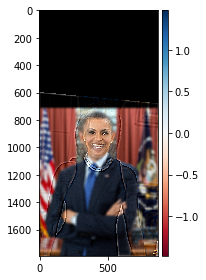

In [131]:
mix = np.zeros((np.shape(im2_aligned)[0], np.shape(im2_aligned)[1], 3))
for i in range(3):
    mix[:,:, i] = high_res1[:,:,i] + low_res2[:,:, i]
skio.imshow(mix);

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


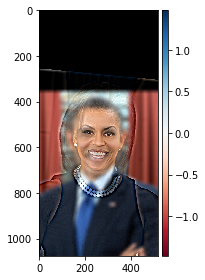

In [133]:
skio.imshow(cropping_perct(mix, crop_factor= 0.2))

In [126]:

# First load images

# high sf
im_lion = skio.imread('lion.jpg')/255
# im1=np.nan_to_num(im1)

# low sf
im1_brad = skio.imread('brad.jpg')/255
# im2=np.nan_to_num(im2)
# Next align images (this code is provided, but may be improved)
im1_aligned, im2_aligned = align_images(im_lion, im1_brad)

## You will provide the code below. Sigma1 and sigma2 are arbitrary 
## cutoff values for the high and low frequencies



Please select 2 points in each image for alignment.


In [127]:
gauss = cv2.getGaussianKernel(7, 10)
outer = np.dot(gauss, gauss.T)

In [128]:

low_res1 = np.zeros((np.shape(im1_aligned)[0], np.shape(im1_aligned)[1], 3))
high_res1 = np.zeros((np.shape(im1_aligned)[0], np.shape(im1_aligned)[1], 3))
for i in range(3):
    low_res1[:,:, i] = signal.convolve2d(im1_aligned[:,:, i], outer, mode = 'same')
    high_res1[:,:,i] = im1_aligned[:,:,i] - low_res1[:,:,i]

In [129]:
low_res2 = np.zeros((np.shape(im2_aligned)[0], np.shape(im2_aligned)[1], 3))
high_res2 = np.zeros((np.shape(im2_aligned)[0], np.shape(im2_aligned)[1], 3))
for i in range(3):
    print("i:", i)
    low_res2[:,:, i] = signal.convolve2d(im2_aligned[:,:, i], outer, mode = 'same')
    print("subtracting")
    high_res2[:,:,i] = im2_aligned[:,:,i]  - low_res2[:,:,i]

i: 0
subtracting
i: 1
subtracting
i: 2
subtracting


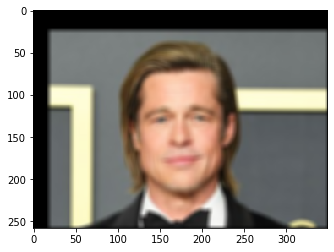

In [130]:
hybrid_lion = np.zeros((np.shape(im2_aligned)[0], np.shape(im2_aligned)[1], 3))
for i in range(3):
    hybrid_lion[:,:, i] = high_res1[:,:,i] + low_res2[:,:, i]

plt.imshow(low_res2); #removed the colorbar




Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


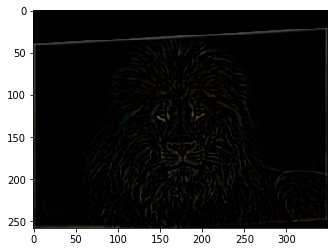

In [131]:
plt.imshow(high_res1);

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


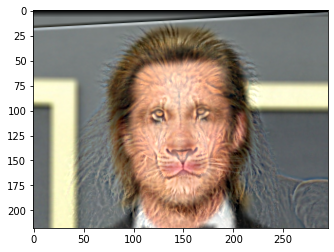

In [132]:
plt.imshow(cropping_perct(hybrid_lion, crop_factor=0.08))

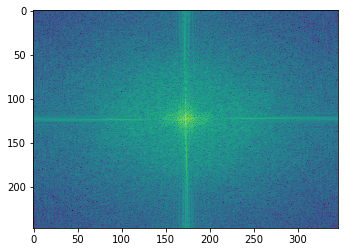

In [699]:
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(hybrid_lion[:,:,0])))))

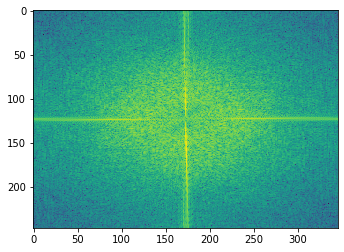

In [700]:
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(high_res1[:,:,0])))))

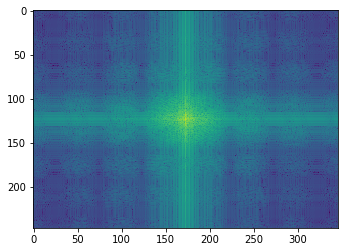

In [701]:
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(low_res2[:,:,0])))))

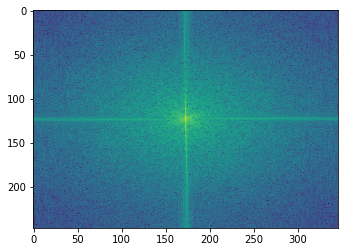

In [702]:
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(im1_aligned[:,:,0])))))

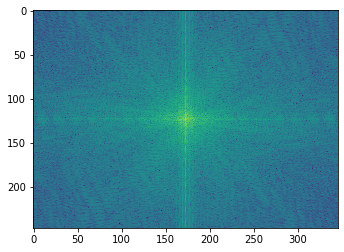

In [703]:
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(im2_aligned[:,:,0])))))

In [450]:
fname = 'hybrid_' + 'lion' + '.jpg'
skio.imsave(fname, hybrid_lion)

Lossy conversion from float64 to uint8. Range [-0.3126900961088069, 1.1831665951675572]. Convert image to uint8 prior to saving to suppress this warning.


In [672]:

# First load images

# high sf
im_ironman = skio.imread('rose.jpeg')/255
# im1=np.nan_to_num(im1)

# low sf
im_rdj = skio.imread('butterfly.jpg')/255
# im2=np.nan_to_num(im2)
# Next align images (this code is provided, but may be improved)
im1_aligned, im2_aligned = align_images(im_ironman, im_rdj)

## You will provide the code below. Sigma1 and sigma2 are arbitrary 
## cutoff values for the high and low frequencies



Please select 2 points in each image for alignment.


In [676]:
gauss = cv2.getGaussianKernel(20, 10)
outer = np.dot(gauss, gauss.T)
low_res1 = np.zeros((np.shape(im1_aligned)[0], np.shape(im1_aligned)[1], 3))
high_res1 = np.zeros((np.shape(im1_aligned)[0], np.shape(im1_aligned)[1], 3))
for i in range(3):
    low_res1[:,:, i] = signal.convolve2d(im1_aligned[:,:, i], outer, mode = 'same')
    high_res1[:,:,i] = im1_aligned[:,:,i] - low_res1[:,:,i]

In [677]:
low_res2 = np.zeros((np.shape(im2_aligned)[0], np.shape(im2_aligned)[1], 3))
high_res2 = np.zeros((np.shape(im2_aligned)[0], np.shape(im2_aligned)[1], 3))
for i in range(3):
    print("i:", i)
    low_res2[:,:, i] = signal.convolve2d(im2_aligned[:,:, i], outer, mode = 'same')
    print("subtracting")
    high_res2[:,:,i] = im2_aligned[:,:,i]  - low_res2[:,:,i]

i: 0
subtracting
i: 1
subtracting
i: 2
subtracting


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


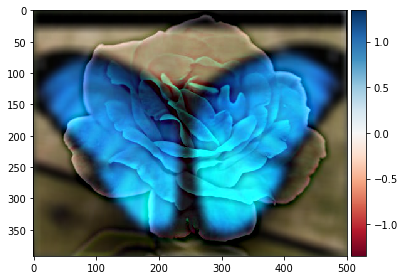

In [678]:
mix = np.zeros((np.shape(im2_aligned)[0], np.shape(im2_aligned)[1], 3))
for i in range(3):
    mix[:,:, i] = high_res1[:,:,i] + low_res2[:,:, i]
skio.imshow(mix);

In [86]:
im1.shape

(3356, 2687, 3)

In [87]:
im2.shape

(1500, 1032, 3)

# Part 2.3: Stacking!!

In [655]:
im_lin = skio.imread('lincoln.jpg')/255.
im_star = skio.imread('starry.jpg')/255.

In [134]:
gauss = cv2.getGaussianKernel(7, 10)
outer = np.dot(gauss, gauss.T)

In [185]:
# For Lincoln
sigma = [2,4,8,16,32]

gas_images = np.zeros((im_lin.shape[0], im_lin.shape[1], 5))
lap_images = np.zeros((im_lin.shape[0], im_lin.shape[1], 5))

for i in range(len(sigma)):
    print(i)
    
    gauss = cv2.getGaussianKernel(25, sigma[i])
    gas = np.dot(gauss, gauss.T)

    lap = abs(np.ones(gas.shape) - gas)
    
    gas_images[:,:,i] = signal.convolve2d(im_lin[:,:, 0], gas, mode = 'same')
    lap_images[:,:,i] = im_lin[:,:,0] - gas_images[:,:,i]

0
1
2
3
4


In [656]:
#For Starry Night
sigma = [2,4,8,16,32]

gas_images = np.zeros((im_star.shape[0], im_star.shape[1], 5))
lap_images = np.zeros((im_star.shape[0], im_star.shape[1], 5))

for i in range(len(sigma)):
    print(i)
    
    gauss = cv2.getGaussianKernel(25, sigma[i])
    gas = np.dot(gauss, gauss.T)

    lap = abs(np.ones(gas.shape) - gas)
    
    gas_images[:,:,i] = signal.convolve2d(im_star[:,:, 0], gas, mode = 'same')
    lap_images[:,:,i] = im_star[:,:,0] - gas_images[:,:,i]

0
1
2
3
4


In [155]:
#For hybrid Night
sigma = [2,4,8,16,32]

gas_images = np.zeros((hybrid_lion.shape[0], hybrid_lion.shape[1], 5))
lap_images = np.zeros((hybrid_lion.shape[0], hybrid_lion.shape[1], 5))

for i in range(len(sigma)):
    print(i)
    
    gauss = cv2.getGaussianKernel(25, sigma[i])
    gas = np.dot(gauss, gauss.T)

    lap = abs(np.ones(gas.shape) - gas)
    
    gas_images[:,:,i] = signal.convolve2d(hybrid_lion[:,:, 0], gas, mode = 'same')
    lap_images[:,:,i] = hybrid_lion[:,:,0] - gas_images[:,:,i]

0
1
2
3
4


## Output of a Laplacian stack revealing the components of the hybrid image

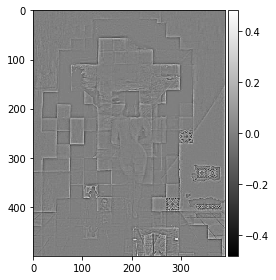

In [188]:
skio.imshow(lap_images[:,:,0], cmap="gray")

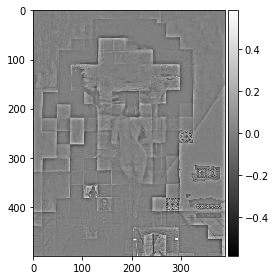

In [197]:
skio.imshow(lap_images[:,:,1], cmap="gray")

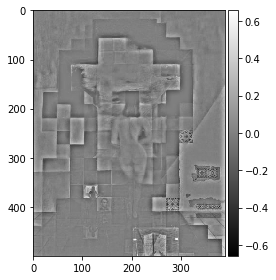

In [190]:
skio.imshow(lap_images[:,:,2], cmap="gray")

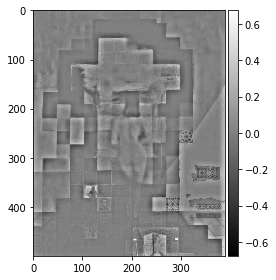

In [196]:
skio.imshow(lap_images[:,:,3], cmap="gray")

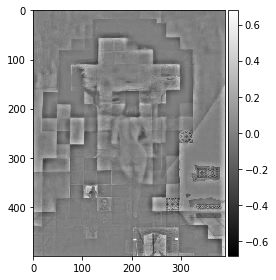

In [189]:
skio.imshow(lap_images[:,:,4], cmap="gray")

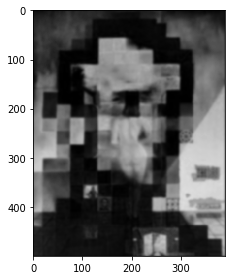

In [191]:
skio.imshow(gas_images[:,:,0], cmap="gray")

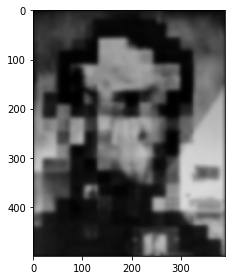

In [193]:
skio.imshow(gas_images[:,:,1], cmap="gray")

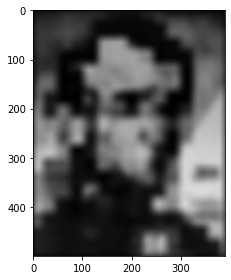

In [194]:
skio.imshow(gas_images[:,:,2], cmap="gray")

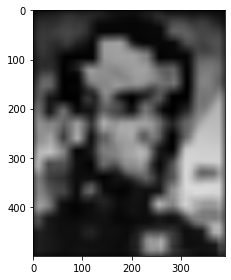

In [195]:
skio.imshow(gas_images[:,:,3], cmap="gray")

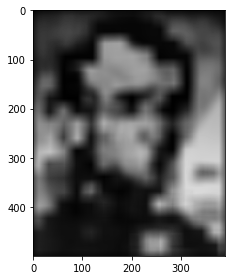

In [192]:
skio.imshow(gas_images[:,:,4], cmap="gray")

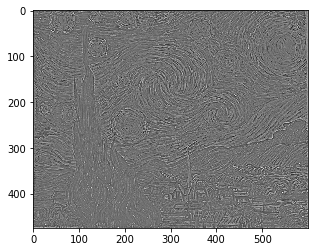

In [671]:
plt.imshow(lap_images[:,:,0], cmap="gray");


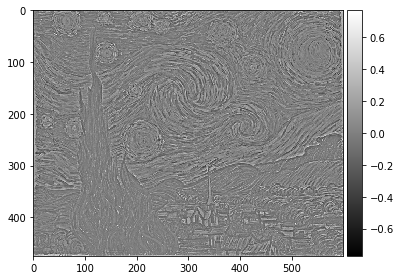

In [662]:
skio.imshow(lap_images[:,:,1], cmap="gray");

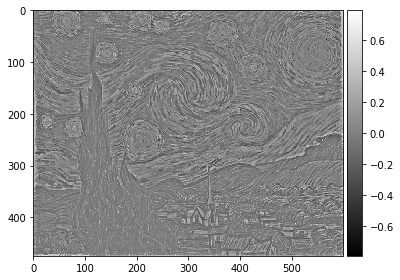

In [663]:
skio.imshow(lap_images[:,:,2], cmap="gray");

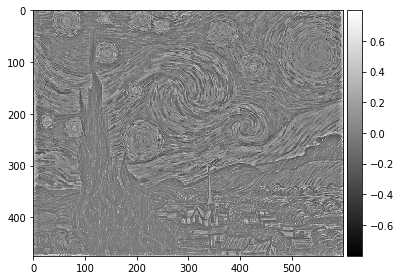

In [664]:
skio.imshow(lap_images[:,:,3], cmap="gray");

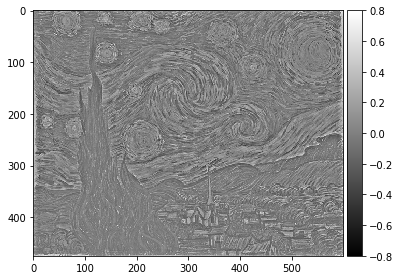

In [665]:
skio.imshow(lap_images[:,:,4], cmap="gray");

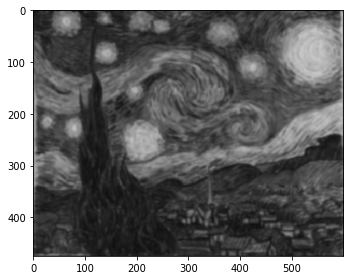

In [666]:
skio.imshow(gas_images[:,:,0], cmap="gray");

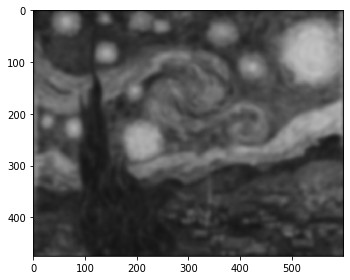

In [667]:
skio.imshow(gas_images[:,:,1]);

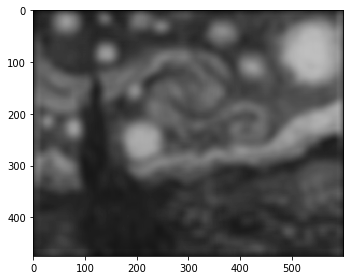

In [668]:
skio.imshow(gas_images[:,:,2]);

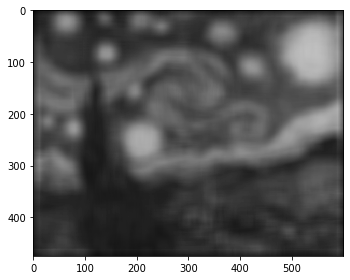

In [669]:
skio.imshow(gas_images[:,:,3]);

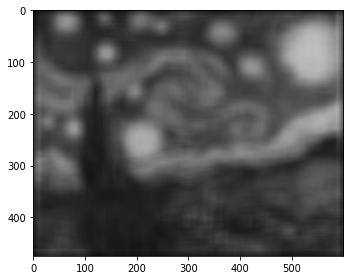

In [670]:
skio.imshow(gas_images[:,:,4]);

In [142]:
pwd()

'/Users/gurmeharkaur'

In [153]:
skio.imshow(lap_images[:,:,5], cmap = 'gray')

IndexError: index 5 is out of bounds for axis 2 with size 5

In [159]:
len(lap_images[0,0,:])

5

In [161]:
for i in range(len(gas_images[0,0,:])):
    fname = '/Users/gurmeharkaur/Desktop/194_proj2/gas_'+ str(i) + 'lion' + '.jpg'
    skio.imsave(fname, gas_images[:,:,i])
#     plt.imshow(lap_images[:,:,i], cmap="gray");


Lossy conversion from float64 to uint8. Range [-0.06842870353331586, 1.0414496158106965]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [-0.016082920778830157, 1.008025788285622]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [-0.010728585259441724, 0.9946423570715978]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [-0.016429109585243958, 0.9936053158995998]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [-0.01828693932208287, 0.9940663859222435]. Convert image to uint8 prior to saving to suppress this warning.


# Part 2.4: Multiresolution Blending

In [218]:

im_ap = skio.imread('apple.jpeg')/255.
im_org = skio.imread('orange.jpeg')/255.
#im_ap = skio.imread('jph.jpeg')/255.
#im_org = skio.imread('joker2.jpg')/255.
#im_ap = skio.imread('mars.png')/255.
#im_org = skio.imread('earth.jpg')/255.

In [215]:
# im2=np.nan_to_num(im2)
# Next align images (this code is provided, but may be improved)
im1_aligned, im2_aligned = align_images(im_ap, im_org)

## You will provide the code below. Sigma1 and sigma2 are arbitrary 
## cutoff values for the high and low frequencies



Please select 2 points in each image for alignment.


TclError: invalid command name "pyimage843"

In [219]:
im1_aligned, im2_aligned = im_ap, im_org

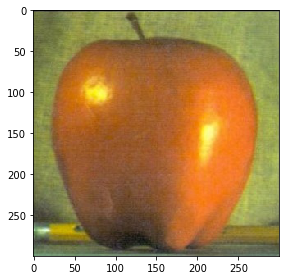

In [220]:
skio.imshow(im1_aligned)

In [182]:
im_ap = im1_aligned
im_org = im2_aligned

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


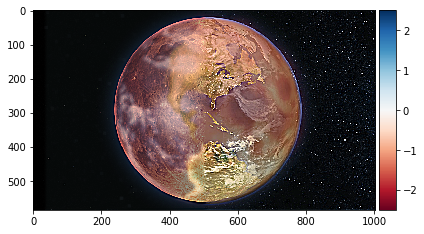

In [1058]:
skio.imshow(res_img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


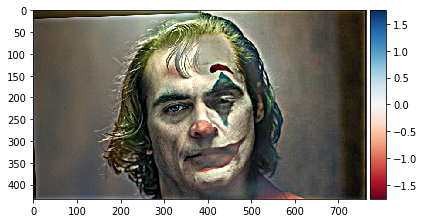

In [486]:
skio.imshow(res_img)

In [651]:
res_img = np.zeros((im_ap.shape[0], im_ap.shape[1],3))
for i in range(6):
    res_img[:,:,0] += three_channels[:,:,i,0]
    res_img[:,:,1] += three_channels[:,:,i,1]
    res_img[:,:,2] += three_channels[:,:,i,2]
    
res_img[:,:,0] = res_img[:,:,0]/2
res_img[:,:,1] = res_img[:,:,1]/2.2
res_img[:,:,2] = res_img[:,:,2]/2

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


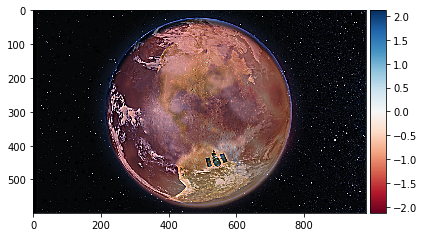

In [652]:
skio.imshow(res_img);

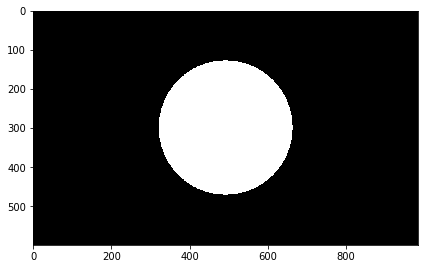

In [653]:
skio.imshow(mask);

In [464]:
fname = 'org_' + 'orapple' + '.jpg'
skio.imsave(fname, res_img)

Lossy conversion from float64 to uint8. Range [-0.30732534244489795, 1.7996528183906448]. Convert image to uint8 prior to saving to suppress this warning.


In [222]:
im1_aligned, im1_aligned = contrast(im1_aligned), contrast(im2_aligned)

In [223]:
def masking_pro(im1,im2):
    
    three_channels = np.zeros((im1.shape[0], im1.shape[1], 6, 3))
    for t in range(3):
    
        sigma = [2, 4, 8, 16, 32]

        ones_im1 = np.zeros((im1.shape[0], im1.shape[1]))
        #regions_ap = cir_mask
        regions_im1 = np.ones((im1.shape[0], im1.shape[1]))
        regions_im1[:, int(im1.shape[1]/2):] = ones_im1[:, int(im1.shape[1]/2):]

        lap_images_im1 = np.zeros((im1.shape[0], im1.shape[1], 5))
        lap_images_im2 = np.zeros((im2.shape[0], im2.shape[1], 5))
        region_images = np.zeros((regions_im1.shape[0], regions_im1.shape[1], 5))
        comb_images = np.zeros((im1.shape[0], im2.shape[1], 6))

        for i in range(len(sigma)):
            print(i)
            gauss = cv2.getGaussianKernel(30, sigma[i])
            outer = np.dot(gauss, gauss.T)
            lap_images_im1[:,:,i] = im1[:,:,t] - signal.convolve2d(im1[:,:, t], outer, mode = 'same')
            lap_images_im2[:,:,i] = im2[:,:,t] - signal.convolve2d(im2[:,:, t], outer, mode = 'same')
            region_images[:,:,i] = signal.convolve2d(regions_im1, outer, mode = 'same')
            
            #another for loop for the mathematical computation to combine images
            for r in range(im1.shape[0]):
                for c in range(im1.shape[1]):
                    comb_images[r,c,i] = (np.multiply(region_images[r,c,i], lap_images_im1[r,c,i]) + np.multiply((1 - region_images[r,c,i]), lap_images_im2[r,c,i]))                
        
        gauss = cv2.getGaussianKernel(60, 10)
        outer = np.dot(gauss, gauss.T)
        #comb_images[:,:,5] = (np.multiply(region_images[:,:,4], signal.convolve2d(im1[:,:, t], outer, mode = 'same')) + np.multiply((1 - region_images[:,:,4]), signal.convolve2d(im2[:,:, t], outer, mode = 'same')))
        
        comb_images[:,:,5] = signal.convolve2d(im1[:,:, t], outer, mode = 'same') + signal.convolve2d(im2[:,:, t], outer, mode = 'same')
            
            
        three_channels[:,:,:,t] = comb_images

    res_img = np.zeros((im1.shape[0], im1.shape[1],3))
    for i in range(6):
        res_img[:,:,0] += three_channels[:,:,i,0]
        res_img[:,:,1] += three_channels[:,:,i,1]
        res_img[:,:,2] += three_channels[:,:,i,2]

        
    return res_img, comb_images, lap_images_im1, lap_images_im2, three_channels

                
        
        

In [224]:
res_img, comb_images, lap_images_im1, lap_images_im2, three_channels = masking_pro(im1_aligned, im2_aligned)

0
1
2
3
4
0
1
2
3
4
0
1
2
3
4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


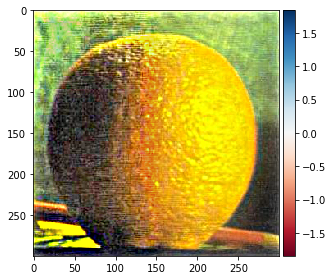

In [226]:
skio.imshow(res_img/2)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


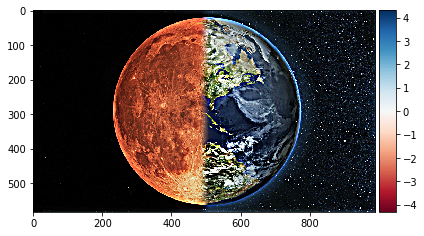

In [93]:
skio.imshow(res_img)

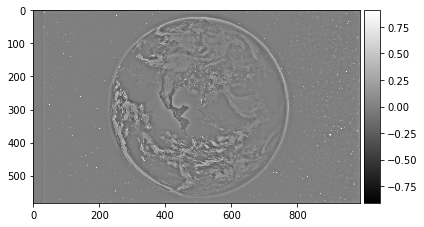

In [70]:
skio.imshow(lap_images_im2[:,:,4], cmap="gray")

Lossy conversion from float64 to uint8. Range [-0.3454143459527178, 0.4513094975163234]. Convert image to uint8 prior to saving to suppress this warning.


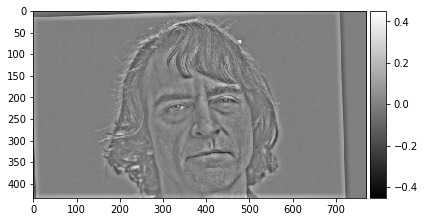

In [1138]:
skio.imshow(lap_images_im1[:,:,4], cmap="gray")
fname = 'lap_' + 'im1_4' + '.jpg'
skio.imsave(fname, lap_images_im1[:,:,4])

Lossy conversion from float64 to uint8. Range [-0.4552323712038544, 0.48854264608654674]. Convert image to uint8 prior to saving to suppress this warning.


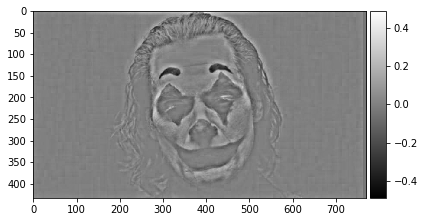

In [1144]:
skio.imshow(lap_images_im2[:,:,4], cmap="gray")
fname = 'lap_' + 'im2_4' + '.jpg'
skio.imsave(fname, lap_images_im2[:,:,4])

Lossy conversion from float64 to uint8. Range [-0.43644653784963805, 0.432575570036247]. Convert image to uint8 prior to saving to suppress this warning.


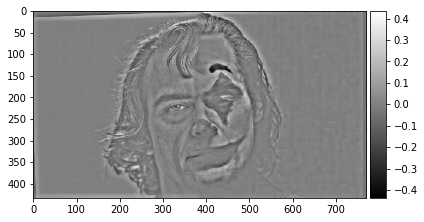

In [1156]:
skio.imshow(comb_images[:,:,4], cmap="gray")
fname = 'comb_' + 'im4' + '.jpg'
skio.imsave(fname, comb_images[:,:,4])

In [ ]:
for i in np.arange(4):
    skio.imshow(comb_images[:,:,4], cmap="gray")
    fname = 'comb_' + 'im' +i+ '.jpg'
    skio.imsave(fname, lap_images_im2[:,:,4])

0

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


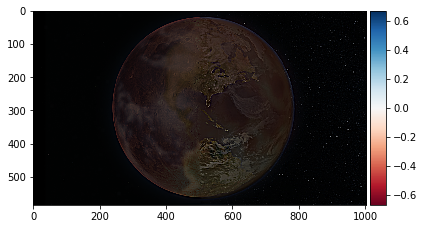

In [1099]:
res_img[:,:,0] = res_img[:,:,0]/1
res_img[:,:,1] = res_img[:,:,1]/1
res_img[:,:,2] = res_img[:,:,2]/1
skio.imshow(res_img);

In [122]:
def circular_masking(h, w, center=None, radius=None):
    if center is None: # use the middle of the image
        center = (int(w/2), int(h/2))
    
    if radius is None: # use the smallest distance between the center and image walls
        radius = min(center[0], center[1], w-center[0], h-center[1])

    


    Y, X = np.ogrid[:h, :w]
    dist_from_center = np.sqrt((X - center[0])**2 + (Y-center[1])**2)

    cir_mask = dist_from_center <= radius
    return cir_mask

h, w = im_ap.shape[:2]
mask = circular_masking(h, w)
masked_img = im_ap.copy() #im_ap = any image you want to input
masked_img[~mask] = 0
center = (int(w/8), int(h/8))
cir_mask = circular_masking(h, w, center=center, radius=radius)
radius = h/3.5
#cir_mask = circular_masking(h, w, radius=radius)


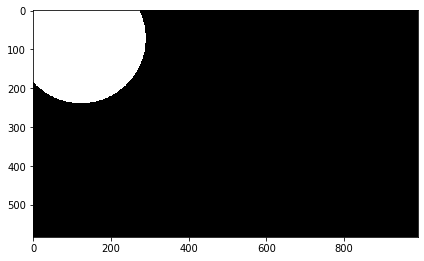

In [123]:
skio.imshow(cir_mask)

In [107]:
def masking_pro_circle(im1,im2):
    
    three_channels = np.zeros((im1.shape[0], im1.shape[1], 6, 3))
    for t in range(3):
    
        sigma = [2, 4, 8, 16, 32]
        


        lap_images_im1 = np.zeros((im1.shape[0], im1.shape[1], 5))
        lap_images_im2 = np.zeros((im2.shape[0], im2.shape[1], 5))
        region_images = np.zeros((cir_mask.shape[0], cir_mask.shape[1], 5))
        comb_images = np.zeros((im1.shape[0], im2.shape[1], 6))

        for i in range(len(sigma)):
            print(i)
            gauss = cv2.getGaussianKernel(30, sigma[i])
            outer = np.dot(gauss, gauss.T)
            lap_images_im1[:,:,i] = im1[:,:,t] - signal.convolve2d(im1[:,:, t], outer, mode = 'same')
            lap_images_im2[:,:,i] = im2[:,:,t] - signal.convolve2d(im2[:,:, t], outer, mode = 'same')
            region_images[:,:,i] = signal.convolve2d(cir_mask, outer, mode = 'same')
            #another for loop for the mathematical computation to combine images
            for r in range(im1.shape[0]):
                for c in range(im1.shape[1]):
                    
                    comb_images[r,c,i] = (np.multiply(region_images[r,c,i], lap_images_im1[r,c,i]) + np.multiply((1 - region_images[r,c,i]), lap_images_im2[r,c,i]))                
        gauss = cv2.getGaussianKernel(60, 10)
        outer = np.dot(gauss, gauss.T)
        comb_images[:,:,5] = (np.multiply(region_images[:,:,4], signal.convolve2d(im1[:,:, t], outer, mode = 'same')) + np.multiply((1 - region_images[:,:,4]), signal.convolve2d(im2[:,:, t], outer, mode = 'same')))


        three_channels[:,:,:,t] = comb_images
    res_img = np.zeros((im1.shape[0], im1.shape[1],3))
    for i in range(6):
        res_img[:,:,0] += three_channels[:,:,i,0]
        res_img[:,:,1] += three_channels[:,:,i,1]
        res_img[:,:,2] += three_channels[:,:,i,2]
                
    return res_img, comb_images, lap_images_im1, lap_images_im2, three_channels
        
        

In [108]:
res_img, comb_images, lap_images_im1, lap_images_im2, three_channels = masking_pro_circle(im1_aligned, im2_aligned)

0
1
2
3
4
0
1
2
3
4
0
1
2
3
4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


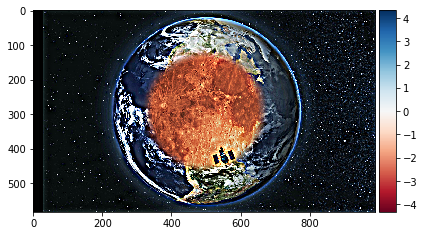

In [106]:
skio.imshow(res_img)